version=0.2

<font size="10">Capstone project: Deep-learning-based classification of kidney histology image patches from Spatial transcriptomics data </font>

Project statement: This project is to develop a deep learning based model that can automatically classify image patches corresponding to Visium spatial transcriptomics analysis of kidney tissue. Primary classification is glomeruli vs non-glomeruli patches. Previously widely used bulk RNAseq method used whole tissue area to profile mRNA expression changes. However, this bulk approach showed limited success in detecting changes in substructure of tissue such as glomeruli in the kidney. To overcome this limitation, Spatially resolved transcriptomics technologies such as Visium were developed in recent years. It showed some success in identifying and clustering image patches with changes. However, not many analysis was done with image data since image data is typically requiring high computational resources and time consuming. To tackle this hurdle, I developed a deep learning based image classification model for kidney Visium spatial transcriptomics data which was generated internally in our institution. This will be a proof of principal and foundation of analysis pipeline for future spatial transcriptomics analysis

This is a Jupyter notebook with the code used for the project. This contains cells with different modules including 1) data collection and image patch generation for training (training, validation, and test sets), 2) image patch extraction from Spatial transcriptomics, 3) creating datasets and data-loaders for deep learning models, 4) loading the ResNet50 pretrained with ImageNet version2, 5) fine tuning parameters with training, 6) visualize training result, 7) test with test dataset, and 8) applying model to Sptial transcriptomics image patches and manual validation.

In [1]:
import pandas as pd
import numpy as np
import tifffile as tiff
from geojson import Polygon, Feature, FeatureCollection, dump
import math
from matplotlib import pyplot as plt
from tqdm import tqdm
import json
import matplotlib.colors
import shutil
import glob
import os
import random
from typing import Dict, List, Tuple
import time
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from random import sample 

import torch
import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2

<font size="5">1) Data collection and image patch generation for training (training, validation, and test sets)</font>

The followings are the steps to take to collect data and image patch generation for training. In order to prevent data leakage, the image patches for training (fine-tuning) were generated from tissue areas that were not used for Spatial transcriptomics.

In [2]:
# Step (1): slide annotation / meta data file and data cleaning 
data_root='/dlab/ldrive/PCS/USCA-VIRTUAL-I22718/raw_data/GSM-AAE728/'
root_analysis="/dlab/ldrive/PCS/USCA-VIRTUAL-I22718/kangbk1/2120224_rat_puro/"
df_annotation=pd.read_csv(data_root+"nibr.spRNAseq/2023_06_22/annotation-files/METHODO-GSM-AAE728-sample-annotation.tsv", sep='\t')
df_anno=df_annotation[['sample_name', 'annotation_on_sample_tube', 'novartis_tracking_id']].drop_duplicates()
df_anno['sample_id']=list(map(lambda x:  x.split('-')[2].split('_')[0], df_anno['sample_name']))
df_anno['Visium_slide_id']=list(map(lambda x: x.split('-')[0]+'-'+x.split('-')[1], df_anno['sample_name']))
df_anno['img_file']=list(map(lambda x:data_root+'images/20230612_GE_BF_AAE728_'+ x +'_Wholeslide_Default_Extended.tif', df_anno['sample_id']))
df_anno['coordinate_file']=list(map(lambda x,y :data_root+'nibr.spRNAseq/2023_06_22/spaceranger-2.1.0-mm10-2020-A/'+ x +'/'+y +'/outs/spatial/tissue_positions.csv',
                                    df_anno['Visium_slide_id'], df_anno['novartis_tracking_id']))

In [3]:
# Step (2): Cropping the whole slide image (slide image files were too large to upload in an annotation software, QuPath) and generating and save an annotation for the Spatial transcriptomics areaa (STx) geojson file in order to upload in the QuPath
# bounding_box function is to detect the tissue boundarie; the function will generate vertical and horizonal boundaries based on average values of rows and columns of image pixels.
# crop_tiff_anno function is to crop whole slide image and generate polygonal annotation of spatial trasncriptomics analysis area (STx annotation). The generated annotation will be saved in geojson file, which can be imported in QuPath, an slide image annotation tool. 
# visualize_spots functions is to visualize the cropping line that can remove unnecessary blank background areas in the image (blue box), STx annotation box(red box), and Spatial transcriptomics spots red round spots
def bounding_box(img, stx_window, ax): # ax=0 for column and ax=1 for row
    if ax==0:
        j=1
    elif ax==1:
        j=0
    d_mean=np.mean(img, axis=ax)
    d_start=round(np.mean(np.array(stx_window[:,j])))
    d_end=round(np.mean(np.array(stx_window[:,j])))
    for i in (range(img.shape[j]//100)):
        if (d_mean[d_start]<0.99) & (d_mean[d_end]<0.99):
            d_start-=i*100
            d_end+=i*100
        elif (d_mean[d_start]>0.99) & (d_mean[d_end]<0.99):
            d_end+=i*100
        elif (d_mean[d_start]<0.99) & (d_mean[d_end]>0.99):
            d_start-=i*100
        elif (d_mean[d_start]>0.99) & (d_mean[d_end]>0.99):
     
            d_start =min(d_start, stx_window[0,j])
            d_end =max(d_end, stx_window[1,j])
            break
    return (d_start, d_end)
def crop_tiff_anno(sl_file, coor_f, sample_ID, dest):#sl_file= slide file location, coor_f= spot coordinate data file
    tissue_position=pd.read_csv(coor_f)
    ori_img_np=tiff.imread(sl_file)
    ori_img_np = np.array(ori_img_np, dtype=float)
    ori_img_np/=255.0
    ori_img_np_gray = np.mean(ori_img_np, axis=2)
    # max and min of tissue position
    ST_windows=np.array([(min(tissue_position['pxl_row_in_fullres']),min(tissue_position['pxl_col_in_fullres'])), 
                          (max(tissue_position['pxl_row_in_fullres']), max(tissue_position['pxl_col_in_fullres']))])
    col_start_end=bounding_box(ori_img_np_gray,ST_windows,0)
    row_start_end=bounding_box(ori_img_np_gray,ST_windows,1)

    img=ori_img_np[row_start_end[0]:row_start_end[1], col_start_end[0]:col_start_end[1], ]

    with tiff.TiffWriter(dest + sample_ID+".ome.tif", bigtiff=True) as tif:
        options = dict(tile=(256, 256), compression='deflate', photometric='rgb')
        tif.write(img, subifds=3, **options)
         # save pyramid levels to the two subifds
         # in production use resampling to generate sub-resolutions
        tif.write(img[::2, ::2], subfiletype=1, **options)
        tif.write(img[::4, ::4], subfiletype=1, **options)
        tif.write(img[::8, ::8], subfiletype=1, **options)
    anno=Polygon([[(int(ST_windows[0,1]-col_start_end[0]), int(ST_windows[0,0]-row_start_end[0])),
                   (int(ST_windows[0,1]-col_start_end[0]), int(ST_windows[1,0]-row_start_end[0])),
                   (int(ST_windows[1,1]-col_start_end[0]), int(ST_windows[1,0]-row_start_end[0])),
                   (int(ST_windows[1,1]-col_start_end[0]), int(ST_windows[0,0]-row_start_end[0])),
                   (int(ST_windows[0,1]-col_start_end[0]), int(ST_windows[0,0]-row_start_end[0]))]])
    features = []
    features.append(Feature(geometry=anno, properties={"objectType":"annotation","classification":{"name":"Visium","color":[255, 0, 0]}}))
    feature_collection = FeatureCollection(features)
    with open(dest+ sample_ID+ '.geojson', 'w') as f:
        dump(feature_collection, f)
        
def visualize_spots(sl_file, coor_f, sample_ID, file_loc, gray=True):
    tissue_position=pd.read_csv(coor_f)
    ori_img_np=tiff.imread(sl_file)
    ori_img_np = np.array(ori_img_np, dtype=float)
    ori_img_np/=255.0
    if gray==True:
        ori_img_np = np.mean(ori_img_np, axis=2)
    else: 
        pass
    STX_windows=np.array([(min(tissue_position['pxl_row_in_fullres']),min(tissue_position['pxl_col_in_fullres'])), 
                     (max(tissue_position['pxl_row_in_fullres']), max(tissue_position['pxl_col_in_fullres']))])
    col_start_end=bounding_box(ori_img_np,STX_windows,0)
    row_start_end=bounding_box(ori_img_np,STX_windows,1)
    img=ori_img_np[row_start_end[0]:row_start_end[1], col_start_end[0]:col_start_end[1], ]
    plt.figure(figsize=(30,30))
    plt.imshow(ori_img_np, alpha=0.50)
    plt.vlines(x=STX_windows[0,1], ymin=STX_windows[0,0], ymax=STX_windows[1,0], linewidth=2, color='r')
    plt.vlines(x=STX_windows[1,1], ymin=STX_windows[0,0], ymax=STX_windows[1,0], linewidth=2, color='r')
    plt.hlines(y=STX_windows[0,0], xmin=STX_windows[0,1], xmax=STX_windows[1,1], linewidth=2, color='r')
    plt.hlines(y=STX_windows[1,0], xmin=STX_windows[0,1], xmax=STX_windows[1,1], linewidth=2, color='r')
    plt.vlines(x=col_start_end[0], ymin=row_start_end[0], ymax=row_start_end[1], linewidth=2, color='b')
    plt.vlines(x=col_start_end[1], ymin=row_start_end[0], ymax=row_start_end[1], linewidth=2, color='b')
    plt.hlines(y=row_start_end[0], xmin=col_start_end[0], xmax=col_start_end[1], linewidth=2, color='b')
    plt.hlines(y=row_start_end[1], xmin=col_start_end[0], xmax=col_start_end[1], linewidth=2, color='b')
    plt.title("Whole slide image: "+sample_ID,  fontsize=40) 
    plt.scatter(tissue_position['pxl_col_in_fullres'], tissue_position['pxl_row_in_fullres'],facecolors='none', edgecolors='r', s=0.5, alpha=1)
    plt.savefig(file_loc)

100%|██████████| 1/1 [11:32<00:00, 692.37s/it]


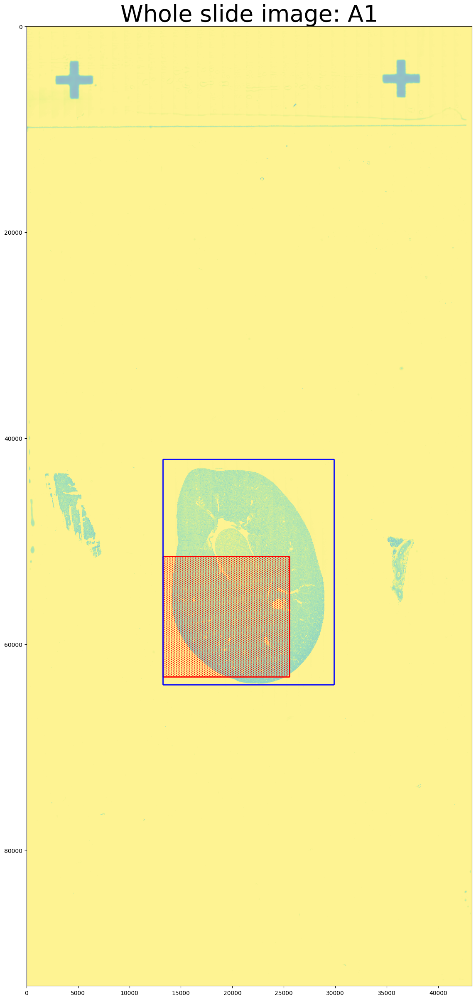

In [4]:
# The followings are excution of above functions.
for i in tqdm(range(8)):
    crop_tiff_anno(df_anno['img_file'][i], df_anno['coordinate_file'][i],df_anno['sample_id'][i], data_root+"image_edited/")
    visualize_spots(df_anno['img_file'][i], df_anno['coordinate_file'][i],df_anno['sample_id'][i], root_analysis+"img_WSI/"+df_anno['sample_id'][i]+'.png')

Step (3): Doing manual annotation of tissue area, glomeruli (ground truth), and artifact(tissue process artifact areas will be excluding from training) in the tissue area outside of spatial transcriptomics window in the cropped images in QuPath. geojson files of STx annotation data were uploaded. After manual annotation, the generated annotations were exported as separated binary mask files: for example, A1__Visium_mask.tif, A1__artefact_mask.tif, A1__training_validation_mask.tif, and A1__Tissue_mask.tif. 

In [8]:
# Step (4): Importing mask files into python and calculate number of pixels of artifact, tissue, spatial transcriptomics window area (Visium), and glomeruli. Based on the number of pixels of each class in the circular patches, patches were excluded/included and labelled with glomeruli or non-glomeruli.
# include_score = tissue pixels excluding visium and artifact areas
# exclude_score = pixels of visium or artifact area
# circular patches with >0 include score and 0 exclude score

# create_circular_mask function is to create circular mask that will make patches as round spot images
# patch_score_calculate function is to load mask_tif files, calculate include and exclude score, patch center coordinates, and generate a data table with information regarding scores and inclusion vs exclusion of patches 
# saving_img_patches, saving_img_mask, saving_img_glom_mask save patches of image, tissue mask, and glomerular mask as npy files in the directories
# visualize_glom function is to visualize generated image patches in the whole slide image with color code for glomerular score. This will help to do a sanity check. 

def create_circular_mask(h, w, center=None, radius=None):
    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])
    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)
    mask = dist_from_center <= radius
    return mask
def patch_score_calculate(s_id):
    with open(data_root+"nibr.spRNAseq/2023_06_22/spaceranger-2.1.0-mm10-2020-A/"+df_anno.loc[df_anno['sample_id']==s_id, 'Visium_slide_id'].values[0]+"/"+df_anno.loc[df_anno['sample_id']==s_id, 'novartis_tracking_id'].values[0]+"/outs/spatial/scalefactors_json.json") as f:
        scale_df = json.load(f)
    mask_visium_np=tiff.imread(root_analysis+"img_mask_v2/"+ s_id+"__Visium_mask.tif")
    mask_training_np=tiff.imread(root_analysis+"img_mask_v2/"+ s_id+"__training_validation_mask.tif")
    mask_tissue_np=tiff.imread(root_analysis+"img_mask_v2/"+ s_id+"__Tissue_mask.tif")
    mask_artifact_np=tiff.imread(root_analysis+"img_mask_v2/"+ s_id+"__artefact_mask.tif")
    mask_exclude=(mask_visium_np+mask_artifact_np)
    mask_include=mask_tissue_np-mask_exclude
    zero_array = np.zeros(mask_include.shape, dtype=mask_include.dtype)
    mask_include=np.maximum(mask_include, zero_array)
    lst_patches=[]
    for i in range((mask_visium_np.shape[1]-140)//120+1):
        for j in range((mask_visium_np.shape[0]-210)//140+1):
            if (i % 2)==0:
                lst_patches.append((j*140+70, i*120+70))
            else: 
                lst_patches.append((j*140+140, i*120+70))
    patch_position=pd.DataFrame(lst_patches, columns=['pxl_row', 'pxl_col'] )
    radius=math.ceil(scale_df['spot_diameter_fullres'])//2
    include=[]
    exclude=[]
    training=[]
    spot_center_col=patch_position.iloc[0]['pxl_col']
    spot_center_row=patch_position.iloc[0]['pxl_row']
    cropped_include_mask=mask_include[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
    mask = create_circular_mask(cropped_include_mask.shape[0], cropped_include_mask.shape[1], center=(radius, radius), radius=radius)
    for i in tqdm(range(len(patch_position['pxl_row']))):
        spot_center_col=patch_position.iloc[i]['pxl_col']
        spot_center_row=patch_position.iloc[i]['pxl_row']
        cropped_include_mask=mask_include[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
        #mask = create_circular_mask(cropped_include_mask.shape[0], cropped_include_mask.shape[1], center=(radius, radius), radius=radius)
        cropped_include_mask[~mask]=0
        include_score=np.sum(cropped_include_mask)
        if include_score==0:
            exclude_score=-1
            glob_score=-1
        elif include_score>0:
            cropped_exclude=mask_exclude[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
            cropped_exclude[~mask]=0
            exclude_score=np.sum(cropped_exclude)
            if exclude_score>0:
                glob_score=-1
            elif exclude_score==0:
                cropped_training_mask=mask_training_np[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
                cropped_training_mask[~mask]=0
                glob_score=np.sum(cropped_training_mask)
        #cropped_img=img[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
        #cropped_img[~mask] = [1,1,1]
        include.append(include_score)
        exclude.append(exclude_score)
        training.append(glob_score)
    patch_position['inclusion_score']=include
    patch_position['exclusion_score']=exclude
    patch_position['glomerular_score']=training
    return patch_position

def saving_img_patches(s_id): # making HE patches for training and validation
    with open(data_root +"nibr.spRNAseq/2023_06_22/spaceranger-2.1.0-mm10-2020-A/"+df_anno.loc[df_anno['sample_id']==s_id, 'Visium_slide_id'].values[0]+"/"+df_anno.loc[df_anno['sample_id']==s_id, 'novartis_tracking_id'].values[0]+"/outs/spatial/scalefactors_json.json") as f:
        scale_df = json.load(f)
    df=patch_df[s_id].loc[(patch_df[s_id]['inclusion_score']>0) & (patch_df[s_id]['exclusion_score']==0)]
    length=len(df['pxl_row'])
    img=tiff.imread(data_root +"image_edited/"+ s_id+".ome.tif")
    radius=math.ceil(scale_df['spot_diameter_fullres'])//2
    spot_c_col=df.iloc[0]['pxl_col']
    spot_c_row=df.iloc[0]['pxl_row']
    cropped_img=img[spot_c_row-radius:spot_c_row+radius+1 ,spot_c_col-radius:spot_c_col+radius+1 ].copy()
    mask = create_circular_mask(cropped_img.shape[0], cropped_img.shape[1], center=(radius, radius), radius=radius)
    for i in tqdm(range(length)):
        spot_center_col=df.iloc[i]['pxl_col']
        spot_center_row=df.iloc[i]['pxl_row']
        cropped_img=img[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
        cropped_img[~mask] = [1,1,1]
        image_filename = root_analysis+'img_db_training/'+s_id+'_R_'+ str(spot_center_row)+'_C_'+str(spot_center_col)+'_G_'+str(df.iloc[i]['glomerular_score'])+ ".npy"
        np.save(image_filename,cropped_img)
def saving_img_mask(s_id): # making patches from tissue mask img
    with open(data_root +"nibr.spRNAseq/2023_06_22/spaceranger-2.1.0-mm10-2020-A/"+df_anno.loc[df_anno['sample_id']==s_id, 'Visium_slide_id'].values[0]+"/"+df_anno.loc[df_anno['sample_id']==s_id, 'novartis_tracking_id'].values[0]+"/outs/spatial/scalefactors_json.json") as f:
        scale_df = json.load(f)
    df=patch_df[s_id].loc[(patch_df[s_id]['inclusion_score']>0) & (patch_df[s_id]['exclusion_score']==0)]
    length=len(df['pxl_row'])
    img=tiff.imread(root_analysis+"img_mask_v2/"+ s_id+"__Tissue_mask.tif")
    radius=math.ceil(scale_df['spot_diameter_fullres'])//2
    spot_center_col=df.iloc[0]['pxl_col']
    spot_center_row=df.iloc[0]['pxl_row']
    cropped_img=img[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
    mask = create_circular_mask(cropped_img.shape[0], cropped_img.shape[1], center=(radius, radius), radius=radius)
    for i in tqdm(range(length)):
        spot_center_col=df.iloc[i]['pxl_col']
        spot_center_row=df.iloc[i]['pxl_row']
        cropped_img=img[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
        cropped_img[~mask] = 0
        image_filename = root_analysis+'img_db_tissue_mask/'+s_id+'_R_'+ str(spot_center_row)+'_C_'+str(spot_center_col)+'_G_'+str(df.iloc[i]['glomerular_score'])+ ".npy"
        np.save(image_filename,cropped_img)
def saving_img_glom_mask(s_id): # making patches from glomerular mask img
    with open(data_root +"nibr.spRNAseq/2023_06_22/spaceranger-2.1.0-mm10-2020-A/"+df_anno.loc[df_anno['sample_id']==s_id, 'Visium_slide_id'].values[0]+"/"+df_anno.loc[df_anno['sample_id']==s_id, 'novartis_tracking_id'].values[0]+"/outs/spatial/scalefactors_json.json") as f:
        scale_df = json.load(f)
    df=patch_df[s_id].loc[(patch_df[s_id]['inclusion_score']>0) & (patch_df[s_id]['exclusion_score']==0)]
    length=len(df['pxl_row'])
    img=tiff.imread(root_analysis+"img_mask_v2/"+ s_id+"__training_validation_mask.tif")
    radius=math.ceil(scale_df['spot_diameter_fullres'])//2
    spot_center_col=df.iloc[0]['pxl_col']
    spot_center_row=df.iloc[0]['pxl_row']
    cropped_img=img[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
    mask = create_circular_mask(cropped_img.shape[0], cropped_img.shape[1], center=(radius, radius), radius=radius)
    for i in tqdm(range(length)):
        spot_center_col=df.iloc[i]['pxl_col']
        spot_center_row=df.iloc[i]['pxl_row']
        cropped_img=img[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
        cropped_img[~mask] = 0
        image_filename = root_analysis+'img_db_glom_mask/'+s_id+'_R_'+ str(spot_center_row)+'_C_'+str(spot_center_col)+'_G_'+str(df.iloc[i]['glomerular_score'])+ ".npy"
        np.save(image_filename,cropped_img)
def visualize_glom (sample_id):
    mask_tissue_np=tiff.imread(root_analysis+"img_mask_v2/"+sample_id+"__Tissue_mask.tif")
    mask_glom_np=tiff.imread(root_analysis+"img_mask_v2/"+sample_id+"__training_validation_mask.tif")
    img=df_patch_generated[(df_patch_generated['inclusion_score']>0) & (df_patch_generated['sample_ID']==sample_id)]
    spot_center_col=list(img['pxl_col'])
    spot_center_row=list(img['pxl_row'])
    spot_glo=list(img['glomerular_score'])
    fig, (ax0, ax1) = plt.subplots(1, 2)
    fig.set_figwidth(15)
    fig.set_figheight(10)
    ax0.imshow(mask_glom_np)
    ax0.set_title('Glomerular mask: '+sample_id, fontsize=18)
    ax0.set_xticks([])
    ax0.set_yticks([])
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    ax1.imshow(mask_tissue_np)
    ax1.set_title("Glomerular Spot distribution: " +sample_id, fontsize=18)
    im=ax1.scatter(spot_center_col,spot_center_row, c=spot_glo, s=10,alpha=0.3, cmap="jet")
    fig.colorbar(im, cax=cax, orientation='vertical').set_label(label='Glomerular score', size=15)
    ax1.set_xticks([])
    ax1.set_yticks([])

The followings were execution of functions described above to do the step (4)

In [9]:
patch_df={}
for i in ['A1', 'A2', 'A3', 'A4', 'B1', 'B2', 'B3', 'B4']:
    patch_df[i]=patch_score_calculate(i)
    patch_df[i]['sample_ID']=i

100%|██████████| 25200/25200 [00:02<00:00, 9199.45it/s] 


In [10]:
for i in ['A1', 'A2', 'A3', 'A4', 'B1', 'B2', 'B3', 'B4']:
          saving_img_patches(i)

100%|██████████| 8522/8522 [01:07<00:00, 126.48it/s]


In [11]:
for i in ['A1', 'A2', 'A3', 'A4', 'B1', 'B2', 'B3', 'B4']:
          saving_img_mask(i)

100%|██████████| 8522/8522 [00:43<00:00, 194.70it/s]


In [12]:
for i in ['A1', 'A2', 'A3', 'A4', 'B1', 'B2', 'B3', 'B4']:
          saving_img_glom_mask(i)

100%|██████████| 8522/8522 [00:36<00:00, 232.99it/s]


In [13]:
#The patch score data was stored in a CSV file. 
df_total=pd.concat([patch_df['A1'],patch_df['A2'],patch_df['A3'],patch_df['A4'],patch_df['B1'],patch_df['B2'],patch_df['B3'],patch_df['B4']])
df_patch_generated=df_total[(df_total['inclusion_score']>0) & (df_total['exclusion_score']==0)]
df_total.to_csv(root_analysis+'total_df.csv')
df_patch_generated.to_csv(root_analysis+'df_patch_generated.csv')# saving file 
#df_patch_generated=pd.read_csv(root_analysis+'df_patch_generated.csv').drop(columns=['Unnamed: 0'])# reloading saved file

Text(0.5, 1.0, 'Histogram of glomerular score of patches')

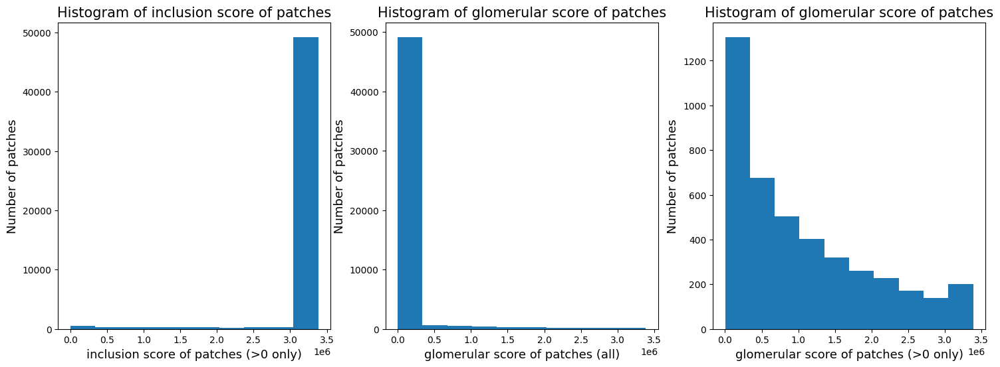

In [17]:
# The followings are visualization of score distribution among patches
fig, (ax0, ax1, ax2) = plt.subplots(1, 3)
fig.set_figwidth(18)
fig.set_figheight(6)

ax0.hist(df_patch_generated['inclusion_score'])
ax0.set_xlabel('inclusion score of patches (>0 only)', fontsize=13)
ax0.set_ylabel('Number of patches', fontsize=13)
ax0.set_title('Histogram of inclusion score of patches', fontsize=15)

ax1.hist(df_patch_generated['glomerular_score'])
ax1.set_xlabel('glomerular score of patches (all)', fontsize=13)
ax1.set_ylabel('Number of patches', fontsize=13)
ax1.set_title('Histogram of glomerular score of patches', fontsize=15)

ax2.hist(df_patch_generated.loc[df_patch_generated['glomerular_score']>0]['glomerular_score'])
ax2.set_xlabel('glomerular score of patches (>0 only)', fontsize=13)
ax2.set_ylabel('Number of patches', fontsize=13)
ax2.set_title('Histogram of glomerular score of patches', fontsize=15)

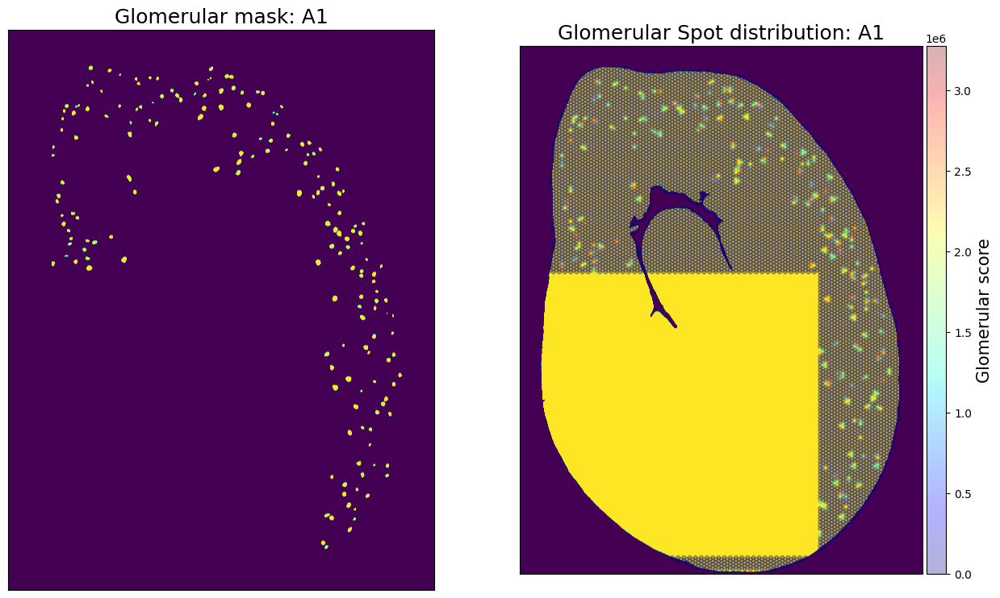

In [18]:
# Excution of visualize_glom
visualize_glom('A1')

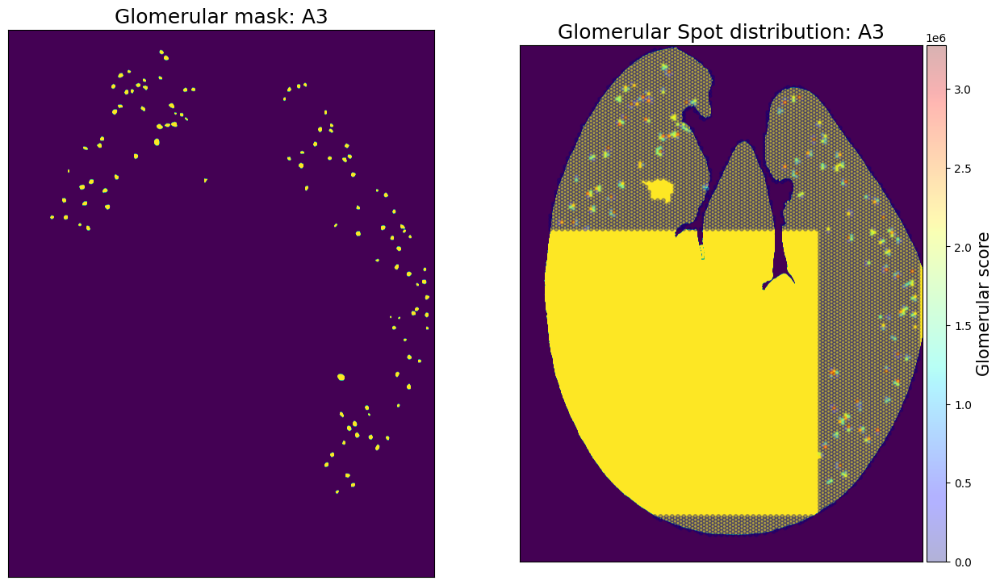

In [19]:
visualize_glom('A3')

In [20]:
def visiualize_glom_patches(sample_id, min_val, max_val ):
    img=df_patch_generated[(df_patch_generated['glomerular_score']>min_val) &(df_patch_generated['glomerular_score']<max_val) & (df_patch_generated['sample_ID']==sample_id)]
    img=img.sample(8)
    fig, ax = plt.subplots(4, 4, sharex='col', sharey='row')
    fig.set_figwidth(30)
    fig.set_figheight(30)
    n=0
    for i in range(4):
        for j in range(4):
            if j%2==0:
                ax[i, j].imshow(np.load(root_analysis+"img_db_glom_mask/"+
                                        img.iloc[n]['sample_ID']+"_R_"+str(img.iloc[n]['pxl_row']) +"_C_" +
                                        str(img.iloc[n]['pxl_col'])+"_G_"+str(img.iloc[n]['glomerular_score'])+".npy"))
                ax[i, j].set_xticks([])
                ax[i, j].set_yticks([])
                ax[i, j].set_title("Glomerular mask; Glomerular score= " +str(img.iloc[n]['glomerular_score']), fontsize=15)

            else:
                ax[i, j].imshow(np.load(root_analysis+"img_db_training/"+
                                        img.iloc[n]['sample_ID']+"_R_"+str(img.iloc[n]['pxl_row']) +"_C_" +
                                        str(img.iloc[n]['pxl_col'])+"_G_"+str(img.iloc[n]['glomerular_score'])+".npy"))
                ax[i, j].set_xticks([])
                ax[i, j].set_yticks([])
                ax[i, j].set_title("H&E image; Glomerular score= " +str(img.iloc[n]['glomerular_score']), fontsize=15)
                n+=1

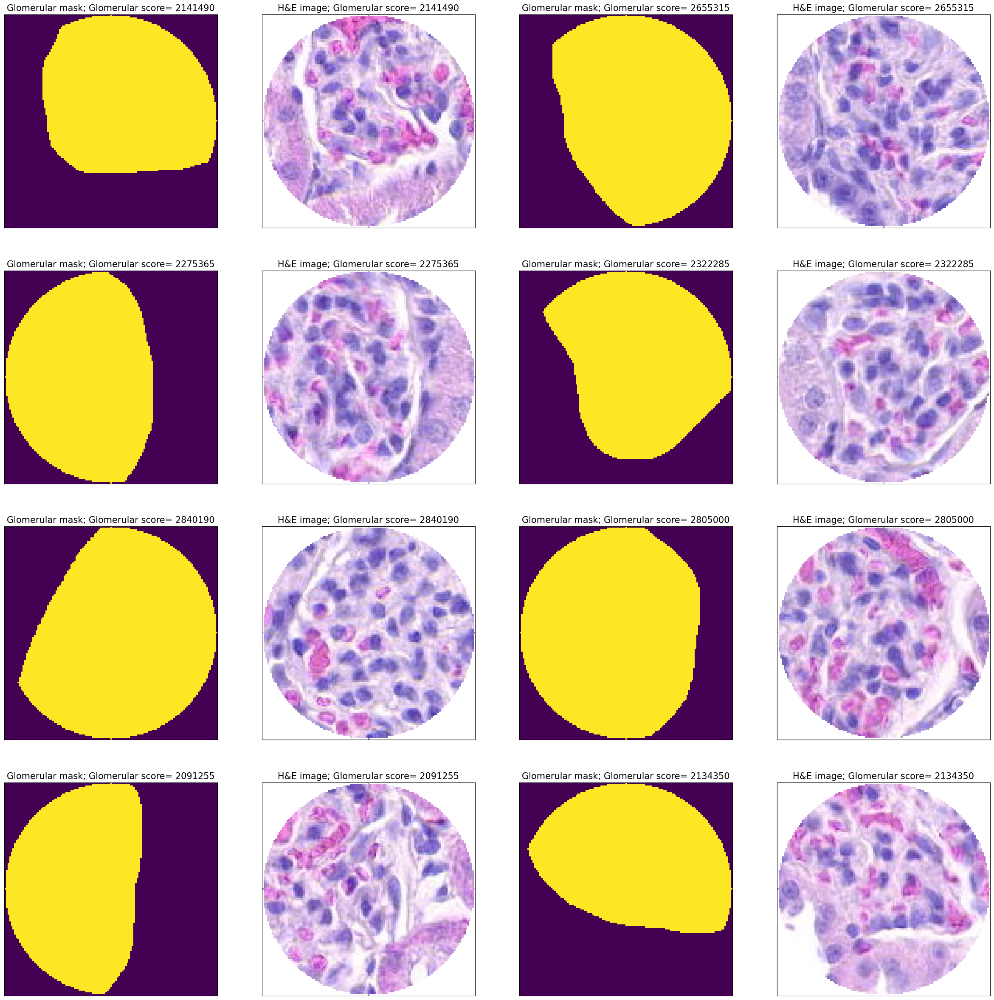

In [21]:
visiualize_glom_patches('A1', 2000000, 3100000 )

<font size="5">2) image patch extraction from Spatial transcriptomics</font>

Spatial transcriptomics image patches, from which transcriptomics was conducted, were extracted by the following process. The extracted image patches will be passed through the fine-tuned deep learning model for prediction. The presence of glomeruli in the patches will be predicted. To confirm accuracy, patches will be randomly selected and examined by a pathologist (author). 

In [23]:
# extracting_patches_STx function is to extract image patches from tissue area that was profiled with spatial transcriptomics technology (Visium)
# visiualize_selected_patches function is to do a sanity check if the extracted patches are right. It randomly selcets and visualize their images along with barcode and in_tissue status; patches with 0 in_tissue value do not contain tissues whereas ones with 1 in_tissue value do contain tissue.
def extracting_patches_STx(sl_file, coor_f, sample_ID, dest):
    tissue_position=pd.read_csv(coor_f)
    with open(data_root+"nibr.spRNAseq/2023_06_22/spaceranger-2.1.0-mm10-2020-A/"+df_anno.loc[df_anno['sample_id']==sample_ID, 'Visium_slide_id'].values[0]+"/"+df_anno.loc[df_anno['sample_id']==sample_ID, 'novartis_tracking_id'].values[0]+"/outs/spatial/scalefactors_json.json") as f:
        scale_df = json.load(f)
    radius=math.ceil(scale_df['spot_diameter_fullres'])//2
    ori_img_np=tiff.imread(sl_file)
    ori_img_np = np.array(ori_img_np, dtype=float)
    ori_img_np/=255.0
    spot_c_col=tissue_position.iloc[0]['pxl_col_in_fullres']
    spot_c_row=tissue_position.iloc[0]['pxl_row_in_fullres']
    cropped_img=ori_img_np[spot_c_row-radius:spot_c_row+radius+1 ,spot_c_col-radius:spot_c_col+radius+1 ].copy()
    mask = create_circular_mask(cropped_img.shape[0], cropped_img.shape[1], center=(radius, radius), radius=radius)
    for i in tqdm(range(len(tissue_position))):
        spot_center_col=tissue_position.iloc[i]['pxl_col_in_fullres']
        spot_center_row=tissue_position.iloc[i]['pxl_row_in_fullres']
        cropped_img=ori_img_np[spot_center_row-radius:spot_center_row+radius+1 ,spot_center_col-radius:spot_center_col+radius+1 ].copy()
        cropped_img[~mask] = [1,1,1]
        image_filename = dest+sample_ID+'_R_'+ str(spot_center_row)+'_C_'+str(spot_center_col)+'_B_'+str(tissue_position.iloc[i]['barcode'])+ ".npy"
        np.save(image_filename,cropped_img) 
def visiualize_selected_patches(coor_f, sample_ID, x_n, y_n, dest):
    tissue_position=pd.read_csv(coor_f)
    img_patches=tissue_position.sample(x_n*y_n)
    fig, ax = plt.subplots(x_n, y_n, sharex='col', sharey='row')
    fig.set_figwidth(12)
    fig.set_figheight(12)
    n=0
    for i in range(x_n):
        for j in range(y_n):
            ax[i, j].imshow(np.load(dest+sample_ID+'_R_'+ str(img_patches.iloc[n]['pxl_row_in_fullres'])+'_C_'+str(img_patches.iloc[n]['pxl_col_in_fullres'])+'_B_'+str(img_patches.iloc[n]['barcode'])+ ".npy"))
            ax[i, j].set_title(sample_ID+'_B_'+str(img_patches.iloc[n]['barcode'].split('-')[0])+"; " + "in_tissue="+str(img_patches.iloc[n]['in_tissue']), fontsize=10)
            ax[i, j].set_yticks([])
            ax[i, j].set_xticks([])
            n+=1

In [24]:
# This is an execution of above function for all slides. 
for i in range(8):
    extracting_patches_STx(df_anno['img_file'][i], df_anno['coordinate_file'][i], df_anno['sample_id'][i], root_analysis+"img_db_STx_patches/")

100%|██████████| 4992/4992 [00:33<00:00, 151.23it/s]


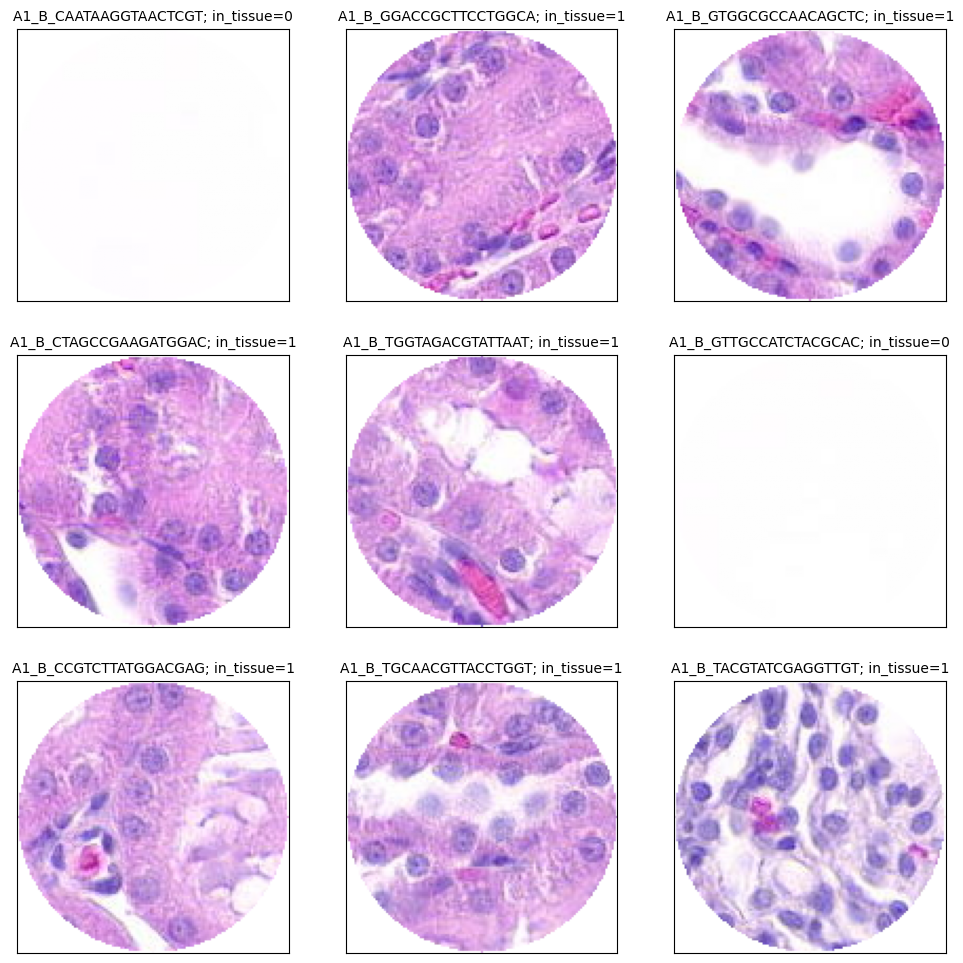

In [26]:
# this is a sanity check if the extract image patches were right
i=0
visiualize_selected_patches(df_anno['coordinate_file'][i], df_anno['sample_id'][i], 3, 3, root_analysis+'img_db_STx_patches/')

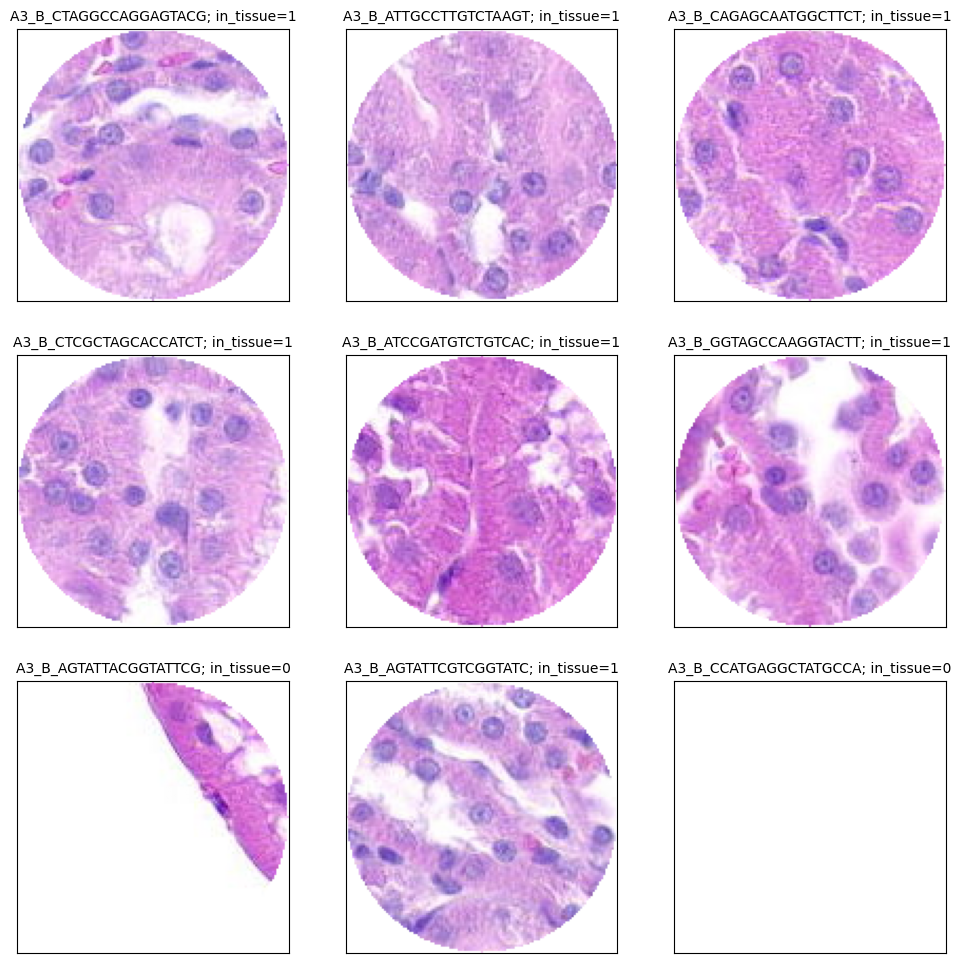

In [27]:
# this is a sanity check if the extract image patches were right
i=4
visiualize_selected_patches(df_anno['coordinate_file'][i], df_anno['sample_id'][i], 3, 3, root_analysis+'img_db_STx_patches/')

<font size="5">3) creating datasets and data-loaders for deep learning models</font>

Using glomerular score threshold, glomerular and non-glomerular patches were selected from training patches. Those selected patches were copied to subfolders (train, test, val). 

In [28]:
# A glomerular score threshold of 3384615/2, which is half of pixels in the patches, for the glomerular positive patches
# 0 glomerular score patches were used for non-glomerular patches (tub) 
root_dir=root_analysis+"img_db_training/"
tub=df_patch_generated[df_patch_generated['glomerular_score']==0].sample(1600)
glom=df_patch_generated[df_patch_generated['glomerular_score']>3384615/3]
# training vs validation vs test = 70% vs 15% vs 15%
glom_test_num=glom_val_num=int(len(glom)*0.15)
tub_test_num=tub_val_num=int(len(tub)*0.15)
glom_lst=np.repeat(np.array(["train","test",'val']), [len(glom)-(glom_test_num+glom_val_num),glom_test_num, glom_val_num])
tub_lst=np.repeat(np.array(["train","test",'val']), [len(tub)-(tub_test_num+tub_val_num),tub_test_num, tub_val_num])
np.random.shuffle(glom_lst)
np.random.shuffle(tub_lst)
glom_file_lst=[root_dir+glom.iloc[n]['sample_ID']+"_R_"+str(glom.iloc[n]['pxl_row']) +"_C_" + str(glom.iloc[n]['pxl_col'])+"_G_"+str(glom.iloc[n]['glomerular_score'])+".npy" for n in range(len(glom))]
tub_file_lst=[root_dir+tub.iloc[n]['sample_ID']+"_R_"+str(tub.iloc[n]['pxl_row']) +"_C_" + str(tub.iloc[n]['pxl_col'])+"_G_"+str(tub.iloc[n]['glomerular_score'])+".npy" for n in range(len(tub))]
df_training_test=pd.concat([glom, tub])
df_training_test['file']=glom_file_lst+tub_file_lst
df_training_test['traning_test']=list(glom_lst)+list(tub_lst)
# this is to make a column with new file locations for filtered patches
df_training_test['new_loc']=list(map(lambda x:root_dir+ df_training_test.iloc[x]['traning_test'] +'/'+ df_training_test.iloc[x]['file'].split('/')[-1], range(len(df_training_test))))
df_training_test.to_csv(root_analysis+'img_db_training/df_training_test.csv')

In [32]:
df_training_test=pd.read_csv(root_analysis+'img_db_training/df_training_test.csv')

In [33]:
print("Total number of image patches: {}".format(len(df_training_test)))
print("Total number of traing image patches with glomeruli: {}".format(len(df_training_test[(df_training_test['glomerular_score']>0)&(df_training_test['traning_test']=='train')])))
print("Total number of test image patches with glomeruli: {}".format(len(df_training_test[(df_training_test['glomerular_score']>0)&(df_training_test['traning_test']=='train')])))
print("Total number of val image patches with glomeruli: {}".format(len(df_training_test[(df_training_test['glomerular_score']>0)&(df_training_test['traning_test']=='val')])))
print("Total number of traing image patches without glomeruli: {}".format(len(df_training_test[(df_training_test['glomerular_score']==0)&(df_training_test['traning_test']=='train')])))
print("Total number of test image patches without glomeruli: {}".format(len(df_training_test[(df_training_test['glomerular_score']==0)&(df_training_test['traning_test']=='train')])))
print("Total number of val image patches without glomeruli: {}".format(len(df_training_test[(df_training_test['glomerular_score']==0)&(df_training_test['traning_test']=='val')])))

Total number of image patches: 3183
Total number of traing image patches with glomeruli: 1109
Total number of test image patches with glomeruli: 1109
Total number of val image patches with glomeruli: 237
Total number of traing image patches without glomeruli: 1120
Total number of test image patches without glomeruli: 1120
Total number of val image patches without glomeruli: 240


In [9]:
# copy files to new location (subfolders: train, test, val)
for i in tqdm(range(len(df_training_test))):
    shutil.copy(df_training_test.iloc[i]['file'], df_training_test.iloc[i]['new_loc'])

100%|██████████| 3183/3183 [00:14<00:00, 223.04it/s]


In [39]:
#making class label files for training, test, and validation sets
idx_to_class = {i:j for i, j in enumerate(["non-glomerular","glomerular"])}
class_to_idx = {value:key for key,value in idx_to_class.items()} # label dictionary
df_train=pd.DataFrame(list(zip(list(map(lambda x: x.split('/')[-1], df_training_test[(df_training_test['traning_test']=='train')]['new_loc'])), 
                      list(map(lambda x: class_to_idx['glomerular'] if x>0 else class_to_idx['non-glomerular'], df_training_test[df_training_test['traning_test']=='train']['glomerular_score'])))), columns=['file_name', 'class'])
df_val=pd.DataFrame(list(zip(list(map(lambda x: x.split('/')[-1], df_training_test[(df_training_test['traning_test']=='val')]['new_loc'])), 
                      list(map(lambda x: class_to_idx['glomerular'] if x>0 else class_to_idx['non-glomerular'], df_training_test[df_training_test['traning_test']=='val']['glomerular_score'])))), columns=['file_name', 'class'])
df_test=pd.DataFrame(list(zip(list(map(lambda x: x.split('/')[-1], df_training_test[df_training_test['traning_test']=='test']['new_loc'])), 
                      list(map(lambda x: class_to_idx['glomerular'] if x>0 else class_to_idx['non-glomerular'], df_training_test[df_training_test['traning_test']=='test']['glomerular_score'])))), columns=['file_name', 'class'])
df_train.to_csv(root_analysis+'img_db_training/annotation/train_annotation.csv')
df_val.to_csv(root_analysis+'img_db_training/annotation/val_annotation.csv')
df_test.to_csv(root_analysis+'img_db_training/annotation/test_annotation.csv')

In [40]:
# this cell to load previously saved dataframe
df_train=pd.read_csv(root_analysis+'img_db_training/annotation/train_annotation.csv').drop(columns=['Unnamed: 0'])
df_val=pd.read_csv(root_analysis+'img_db_training/annotation/val_annotation.csv').drop(columns=['Unnamed: 0'])
df_test=pd.read_csv(root_analysis+'img_db_training/annotation/test_annotation.csv').drop(columns=['Unnamed: 0'])

In [48]:
# building a dataset with filtered image patches
# Step (1): define Augmentation for training and validation/test (Adapted from Chilamkurthy, S. (n.d.). Transfer learning for computer vision tutorial¶. Transfer Learning for Computer Vision Tutorial - PyTorch Tutorials 2.2.0+cu121 documentation. https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html )
data_transforms = {
    'train':A.Compose([
        A.Rotate(p=0.5),
        A.Transpose(p=0.5),
        A.VerticalFlip(p=0.5),
        A.HorizontalFlip (p=0.5),
        A.Resize(height=112, width=112,p=1),
        ToTensorV2(),
    ]), 
    'val':A.Compose([
        A.Resize(height=112, width=112,p=1),
        ToTensorV2(),
    ]), 
    'test':A.Compose([
        A.Resize(height=112, width=112,p=1),
        ToTensorV2(),
    ])}
# Step (2): define dataset class (Adapted from online version of Bourke, D. (2023, December). Learn Pytorch. become a deep learning engineer. get hired. Zero To Mastery. https://zerotomastery.io/courses/learn-pytorch/ )
class HistoImageDataset(Dataset):
    def __init__(self, annotations_file, img_dir, lab_dict,transform=None):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.labels=list(lab_dict.keys())
        self.label_to_idx=lab_dict
        self.transform = transform
    def __len__(self):
        return len(self.img_labels)
    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx]['file_name'])
        image = np.float32(np.load(img_path))
        label = self.img_labels.iloc[idx]['class']
        if self.transform:
            image = self.transform(image=image)["image"]
        return image, label
def visiualize_patches(dataset, x_n, y_n):
    length=dataset.__len__()
    fig, ax = plt.subplots(x_n, y_n, sharex='col', sharey='row')
    fig.set_figwidth(12)
    fig.set_figheight(12)
    for i in range(x_n):
        for j in range(y_n):
            img=dataset.__getitem__(random.randint(0, length-1))
            ax[i, j].imshow(img[0].permute([1,2,0]))
            ax[i, j].set_title("Label: " + idx_to_class[img[1]], fontsize=10)
            ax[i, j].set_yticks([])
            ax[i, j].set_xticks([])

In [43]:
# The followings are executions of dataset initiation
image_datasets = {x: HistoImageDataset(annotations_file=root_dir+'/annotation/'+ x +'_annotation.csv',
                                       img_dir=root_analysis+'img_db_training/'+x,
                                       lab_dict=class_to_idx,
                                       transform=data_transforms[x])
                  for x in ['train', 'val','test']}
# Using DataLoader form pytorch, loading dataset in batches
dataloaders = {x: DataLoader(image_datasets[x], batch_size=32, shuffle=True, num_workers=4)
              for x in ['train', 'val','test']}

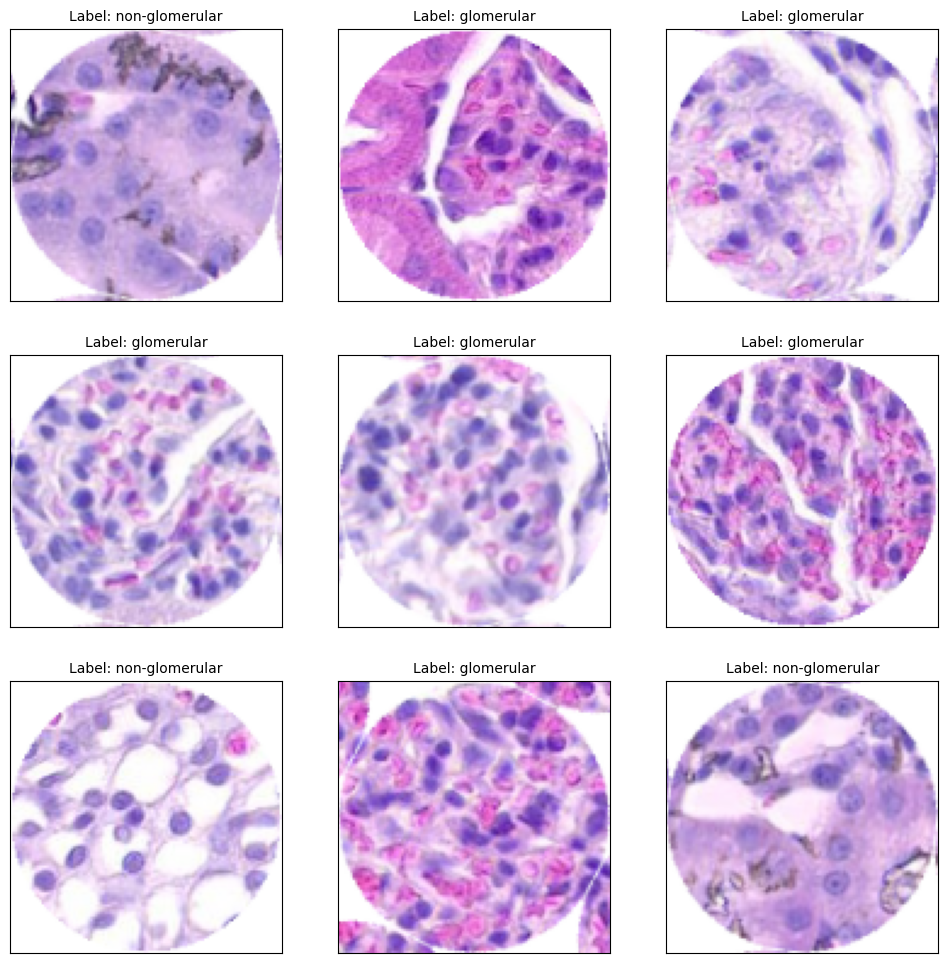

In [50]:
visiualize_patches(image_datasets['train'],3,3)

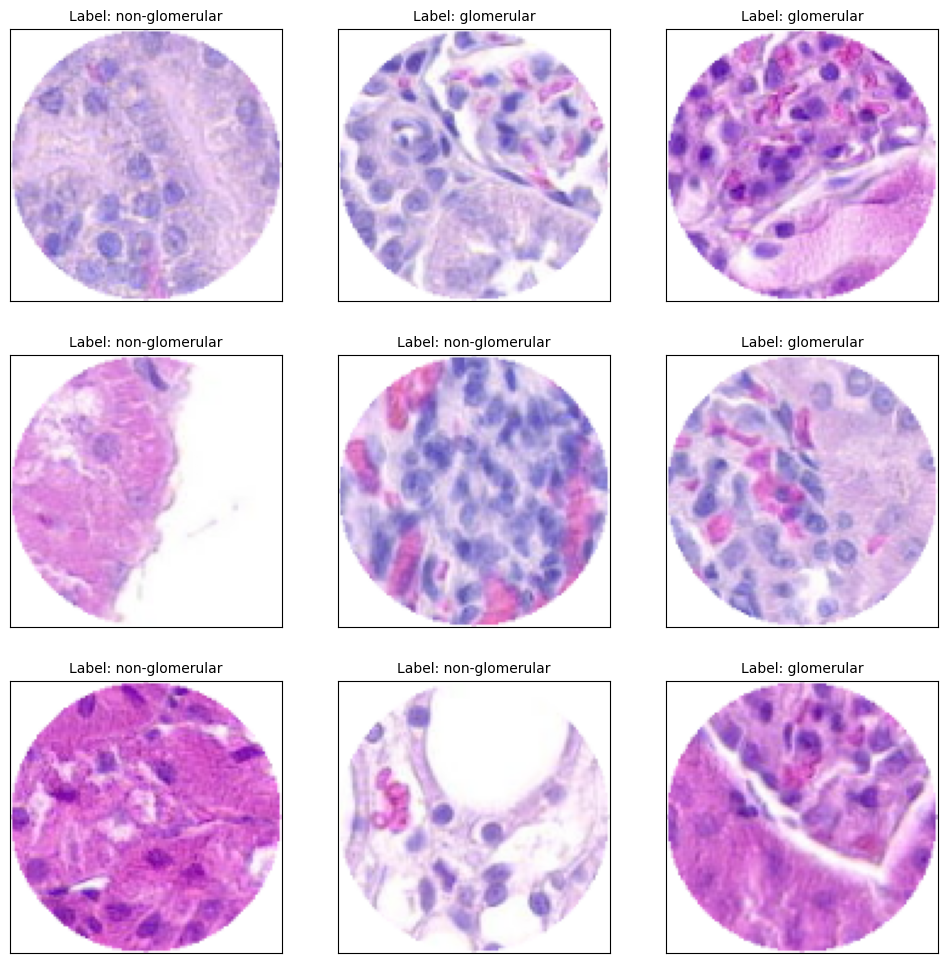

In [51]:
visiualize_patches(image_datasets['test'],3,3)

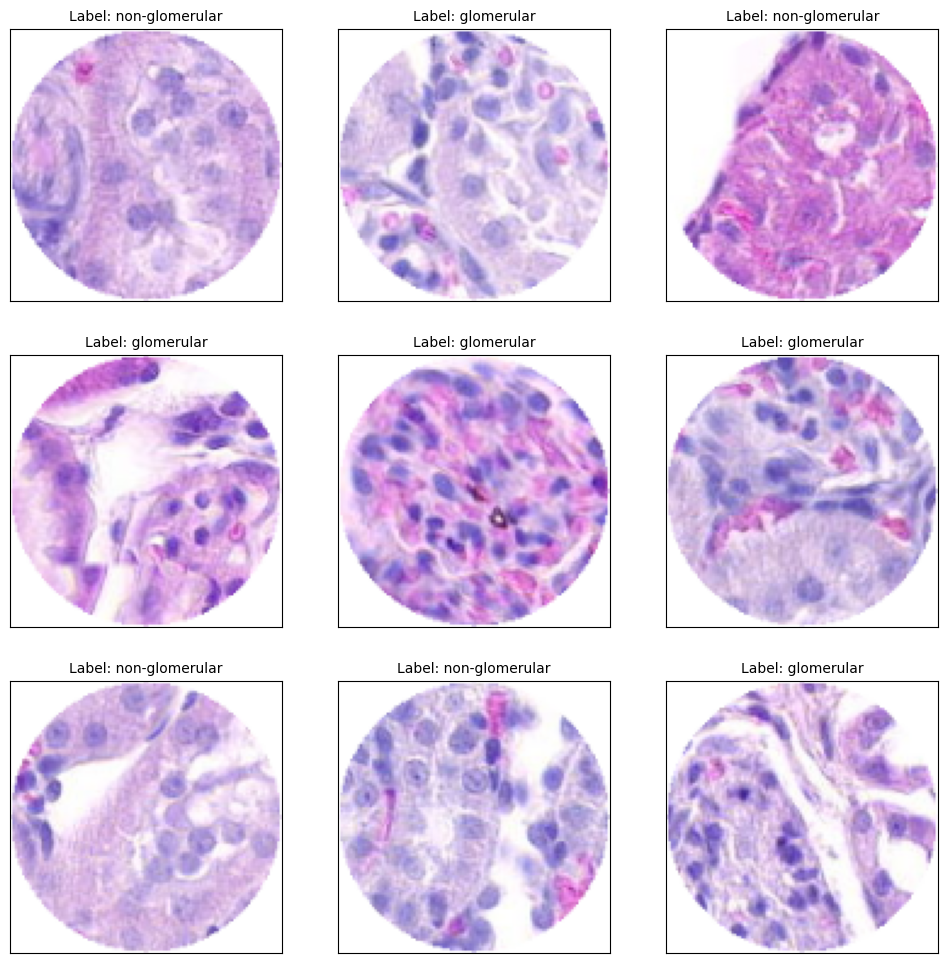

In [52]:
visiualize_patches(image_datasets['val'],3,3)

<font size="5">4) Loading the ResNet50 pretrained with ImageNet version2</font>

To shorten training process, pretrained ResNet50 was loaded and fine-tuned with training dataset. Since ResNet50 has 1000 class for classification, the final layer was modified to have only 2 classes.

In [53]:
device = "cuda" if torch.cuda.is_available() else "cpu"
torch.manual_seed(42)
torch.cuda.manual_seed(42)
# Loading ResNet50
ResNet_loaded = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2).to(device)
# modifying class number in ResNet50 from 1000 to 2. (Adapted from Ruman, R. (2023, November 7). Part 1: Ultimate Guide to fine-tuning in pytorch&nbsp;: Pre-trained model and its configuration. Medium. https://rumn.medium.com/part-1-ultimate-guide-to-fine-tuning-in-pytorch-pre-trained-model-and-its-configuration-8990194b71e )
num_features = ResNet_loaded.fc.in_features
num_classes=2
ResNet_loaded.fc = nn.Sequential(
    nn.Linear(num_features, 256),  # Additional linear layer with 256 output features
    nn.ReLU(inplace=True),         # Activation function (you can choose other activation functions too)
    nn.Dropout(0.1),               # Dropout layer with 50% probability
    nn.Linear(256, num_classes)    # Final prediction fc layer
)
# defining loss function, optimizer, and learning rate
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ResNet_loaded.parameters(), lr=0.005) 

In [59]:
# Defining traing functions (Adapted from online version of Bourke, D. (2023, December). Learn Pytorch. become a deep learning engineer. get hired. Zero To Mastery. https://zerotomastery.io/courses/learn-pytorch/ )
def train_step(model: torch.nn.Module, 
               dataloader: torch.utils.data.DataLoader, 
               ls_fn: torch.nn.Module, 
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:
    model.train()
    train_loss, train_acc = 0, 0
    for batch, (img_p, label) in enumerate(dataloader):# looping through data batches
        img_p, label = img_p.to(device), label.to(device)
        pred_logits = model(img_p)  
        loss = ls_fn(pred_logits, label)
        train_loss += loss.item() 
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        pred_label = torch.argmax(torch.softmax(pred_logits, dim=1), dim=1)
        train_acc += (pred_label == label).sum().item()/len(pred_logits)
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

def val_step(model: torch.nn.Module,
             dataloader: torch.utils.data.DataLoader, 
             ls_fn: torch.nn.Module,
             device: torch.device) -> Tuple[float, float]:
    model.eval() 
    val_loss, val_acc = 0, 0
    with torch.inference_mode():
        for batch, (img_p, label) in enumerate(dataloader):
            img_p, label = img_p.to(device), label.to(device)
            val_pred_logits = model(img_p)
            loss = ls_fn(val_pred_logits, label)
            val_loss += loss.item()
            val_pred_labels = val_pred_logits.argmax(dim=1)
            val_acc += ((val_pred_labels == label).sum().item()/len(val_pred_labels))
    val_loss = val_loss / len(dataloader)
    val_acc = val_acc / len(dataloader)
    return val_loss, val_acc

def train(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          val_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          ls_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
    results = {"train_loss": [],
               "train_acc": [],
               "val_loss": [],
               "val_acc": []}
    model.to(device)
    for epoch in range(epochs):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          ls_fn=ls_fn,
                                          optimizer=optimizer,
                                          device=device)
        val_loss, val_acc = val_step(model=model,
          dataloader=val_dataloader,
          ls_fn=ls_fn,
          device=device)
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"val_loss: {val_loss:.4f} | "
          f"val_acc: {val_acc:.4f}"
        )

        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["val_loss"].append(val_loss)
        results["val_acc"].append(val_acc)

    return results

In [60]:
#exxecution of training (fine-tuning) of ResNet50
training_results = train(model=ResNet_loaded,
                         train_dataloader=dataloaders['train'],
                         val_dataloader=dataloaders['val'],
                         optimizer=optimizer,
                         ls_fn=loss_fn,
                         epochs=500,
                         device=device)

Epoch: 1 | train_loss: 0.3907 | train_acc: 0.8701 | val_loss: 1.5870 | val_acc: 0.5845
Epoch: 2 | train_loss: 0.1936 | train_acc: 0.9243 | val_loss: 0.9946 | val_acc: 0.7106
Epoch: 3 | train_loss: 0.1647 | train_acc: 0.9361 | val_loss: 0.4123 | val_acc: 0.8721
Epoch: 4 | train_loss: 0.1580 | train_acc: 0.9386 | val_loss: 4.7889 | val_acc: 0.5157
Epoch: 5 | train_loss: 0.1544 | train_acc: 0.9402 | val_loss: 15.3065 | val_acc: 0.4966
Epoch: 6 | train_loss: 0.1464 | train_acc: 0.9480 | val_loss: 8.6203 | val_acc: 0.4968
Epoch: 7 | train_loss: 0.1842 | train_acc: 0.9397 | val_loss: 0.1889 | val_acc: 0.9185
Epoch: 8 | train_loss: 0.1120 | train_acc: 0.9554 | val_loss: 0.3871 | val_acc: 0.8698
Epoch: 9 | train_loss: 0.1310 | train_acc: 0.9489 | val_loss: 3.2240 | val_acc: 0.5322
Epoch: 10 | train_loss: 0.1173 | train_acc: 0.9576 | val_loss: 0.3151 | val_acc: 0.8912
Epoch: 11 | train_loss: 0.0980 | train_acc: 0.9667 | val_loss: 0.1252 | val_acc: 0.9500
Epoch: 12 | train_loss: 0.1051 | train_a

In [37]:
#saving training outcome and fine-tuned model.
pd.DataFrame(training_results).to_csv(root_analysis+'resnet_50_500.csv')
torch.save(ResNet_loaded, root_analysis+'resnet50_fine_tuned.pth')

In [63]:
ResNet_loaded = torch.load(root_analysis+'resnet50_fine_tuned.pth')

In [38]:
# Defining a plot function for loss and accuracy curves (Adapted from online version of Bourke, D. (2023, December). Learn Pytorch. become a deep learning engineer. get hired. Zero To Mastery. https://zerotomastery.io/courses/learn-pytorch/ )

def plot_loss_curves(results):
    loss = results["train_loss"]
    test_loss = results["val_loss"]
    accuracy = results["train_acc"]
    test_accuracy = results["val_acc"]

    epochs = range(len(results["train_loss"]))

    plt.figure(figsize=(15, 7))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label="train_loss")
    plt.plot(epochs, test_loss, label="val_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label="train_accuracy")
    plt.plot(epochs, test_accuracy, label="val_accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()


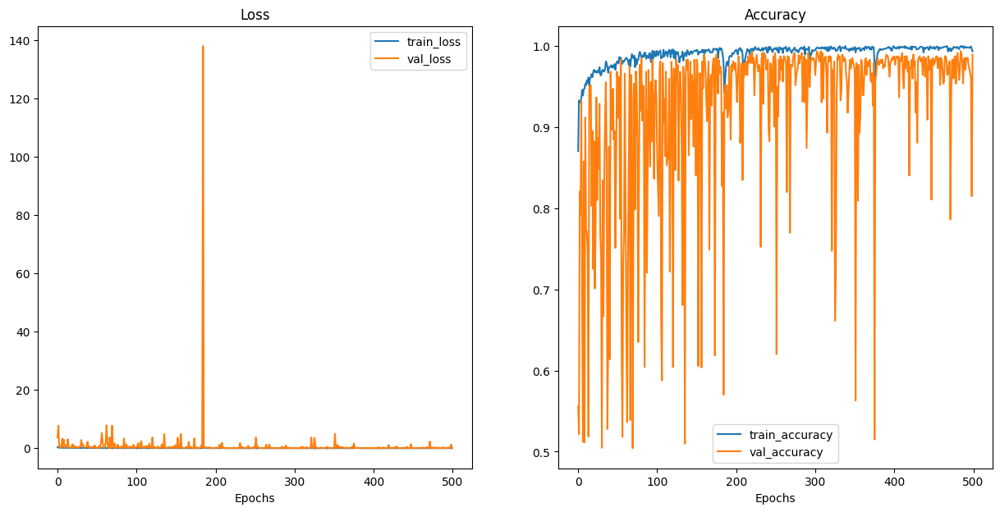

In [39]:
plot_loss_curves(training_results)

<font size="5">5) test model with the test dataset </font>

The following is to test the fine-tuned model with the test dataset that has a ground truth labeling. 

In [61]:
# This is a function to execute a model test with the test dataset
def model_eval (model, dataloader,ls_fn ,idx_to_label, visualize_x=3, visualize_y=3):
    model.eval()
    val_loss, val_acc = 0, 0
    img=torch.empty(0, 3, 112, 112).to('cpu')
    label=torch.empty(0).to('cpu')
    pred=torch.empty(0).to('cpu')
    with torch.inference_mode():
        for batch, (img_p, label_p) in enumerate(dataloader):
            img_p, label_p = img_p.to(device), label_p.to(device)
            val_pred_logits = ResNet_loaded(img_p)
            loss = ls_fn(val_pred_logits, label_p)
            val_loss += loss.item()
            # Calculate and accumulate accuracy
            val_pred_labels = val_pred_logits.argmax(dim=1)
            val_acc += ((val_pred_labels == label_p).sum().item()/len(val_pred_labels))
            img=torch.cat((img, img_p.to('cpu')), 0)
            label=torch.cat((label, label_p.to('cpu')), 0)
            
            pred=torch.cat((pred, val_pred_labels.to('cpu')), 0)
    val_loss = val_loss / len(dataloader)
    val_acc = val_acc / len(dataloader)
    label=list(map(lambda x: idx_to_class[x], label.int().tolist()))
    pred=list(map(lambda x: idx_to_class[x], pred.int().tolist()))
    cf_matrix = confusion_matrix(label, pred, labels=list(idx_to_label.values()))
    disp = ConfusionMatrixDisplay(confusion_matrix=cf_matrix, display_labels=idx_to_label.values())

    length=img.shape[0]
    fig, ax = plt.subplots(visualize_x, visualize_y, sharex='col', sharey='row')
    fig.set_figwidth(15)
    fig.set_figheight(15)
    for i in range(visualize_x):
        for j in range(visualize_y):
            num=random.randint(0, length-1)
            ax[i, j].imshow(img[num].permute([1,2,0]))
            ax[i, j].set_title("True: " + str(label[num]) +"; Predicted: " + str(pred[num]) , fontsize=10)
            ax[i, j].set_yticks([])
            ax[i, j].set_xticks([])
    plt.figure()
    disp.plot()
    
    plt.show()
    return (img, label, pred, val_loss, val_acc)


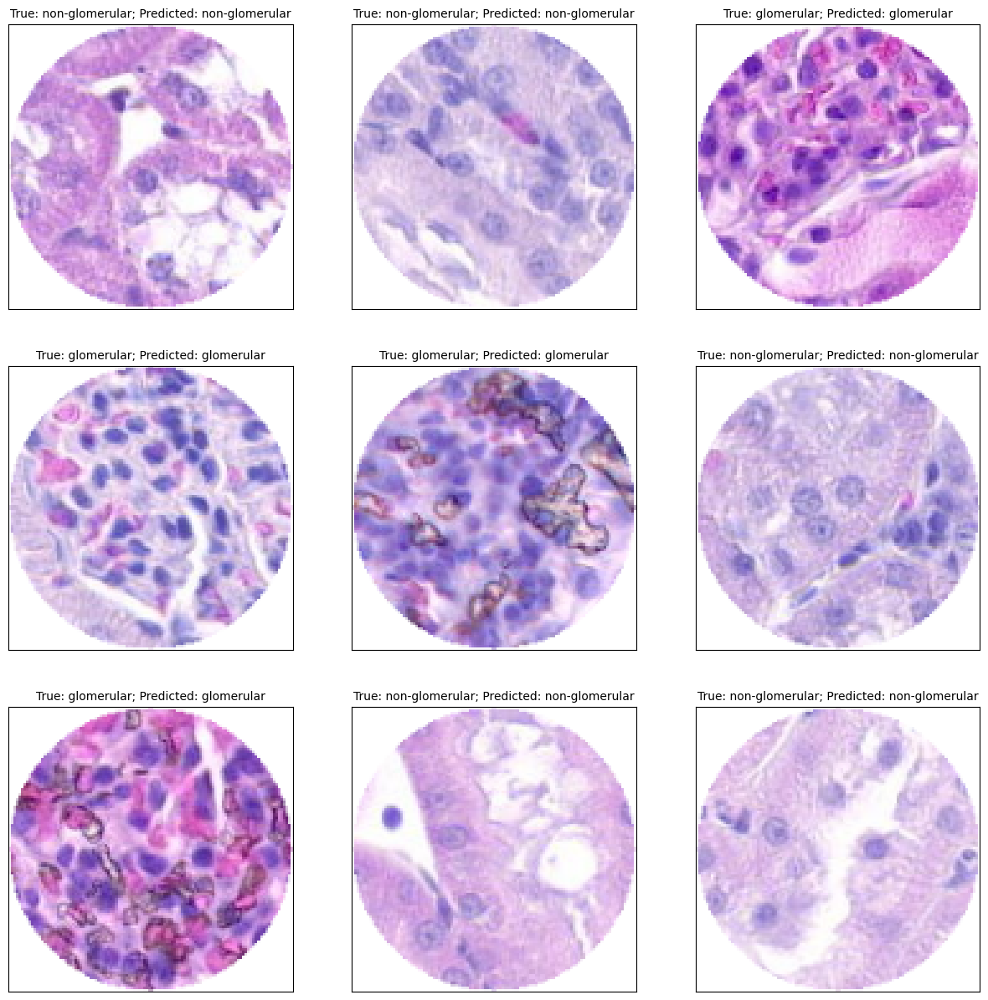

<Figure size 640x480 with 0 Axes>

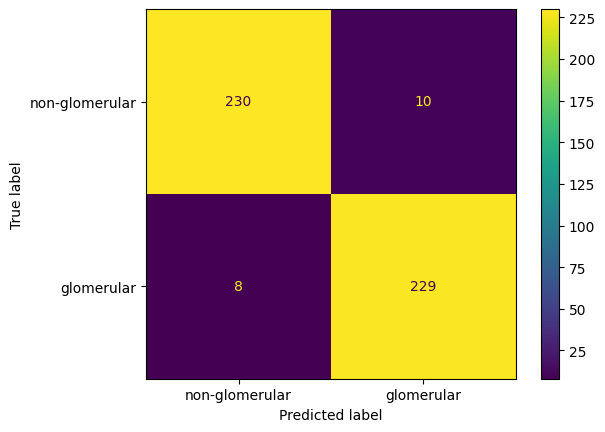

In [64]:
img, l, p, loss, acc=model_eval(ResNet_loaded,dataloaders['test'], loss_fn, idx_to_class)

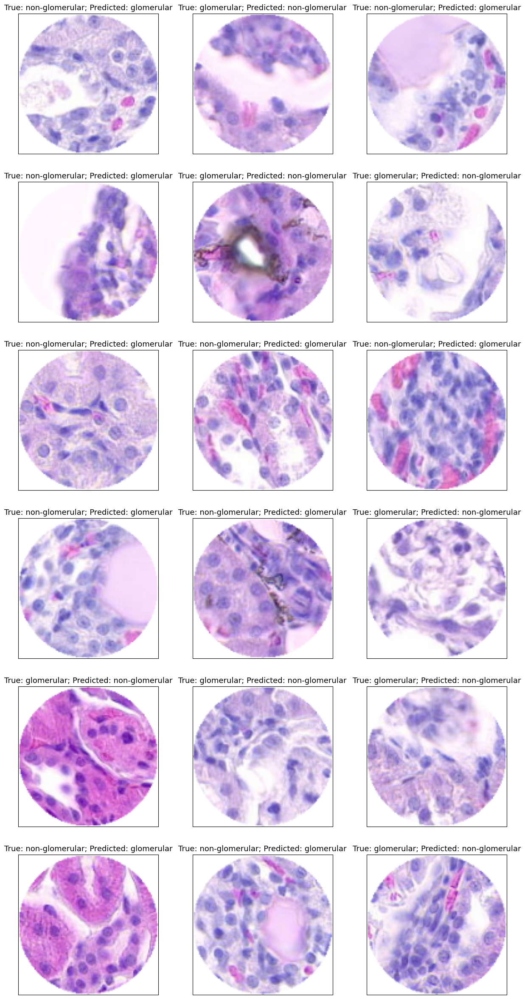

In [263]:
# To visualize incorrect prediction spot
incorrect_prediction=[]
for n in range (len(l)):
    if l[n]==p[n]:
        incorrect_prediction.append(False)
    else:
        incorrect_prediction.append(True)

fig, ax = plt.subplots(6, 3, sharex='col', sharey='row')
fig.set_figwidth(15)
fig.set_figheight(30)
num=0
for i in range(6):
    for j in range(3):
        ax[i, j].imshow(img[incorrect_prediction][num].permute([1,2,0]))
        ax[i, j].set_title("True: " + str(np.array(l)[incorrect_prediction][num]) +"; Predicted: " + str(np.array(p)[incorrect_prediction][num]) , fontsize=13)
        ax[i, j].set_yticks([])
        ax[i, j].set_xticks([])
        num+=1

In [ ]:
<font size="5">6) Applying fine tuned mode to Sptatial Transcriptomics </font>
This to to apply model to the image patches extracted from Spatial transcriptomics data

In [96]:
# HistoImageDataset_STx is to generate a Dataset with Spatial Trasncriptomics data
# model_eval_Stx is to apply model to Spatial transcriptomics dataset to predict
# visualize_stx_prediction
class HistoImageDataset_STx(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        self.img_lst = os.listdir(self.img_dir)
        self.transform = transform
    def __len__(self):
        return len(self.img_lst)
    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_lst[idx])
        image = np.float32(np.load(img_path))
        label = 'unknown'
        if self.transform:
            image = self.transform(image=image)["image"]
        return image, label
def model_eval_Stx (model, dataloader,idx_to_label ):
    model.eval()
    img=torch.empty(0, 3, 112, 112).to('cpu')
    pred=torch.empty(0).to('cpu')
    with torch.inference_mode():
        for batch, (img_p, label_p) in enumerate(dataloader):
            img_p = img_p.to(device)
            STx_pred_logits = ResNet_loaded(img_p)
            STx_pred_labels = STx_pred_logits.argmax(dim=1)
            img=torch.cat((img, img_p.to('cpu')), 0)          
            pred=torch.cat((pred, STx_pred_labels.to('cpu')), 0)
    pred=list(map(lambda x: idx_to_label[x], pred.int().tolist()))
    return (img, pred)

def visualize_stx_prediction(img, pred, preference= None, visualize_x=3, visualize_y=3):
    fig, ax = plt.subplots(visualize_x, visualize_y, sharex='col', sharey='row')
    fig.set_figwidth(15)
    fig.set_figheight(15)
    if preference:
        img=img[np.array(pred)==preference]
        pred=np.array(pred)[np.array(pred)==preference]
    else:
        pass
    nums=sample(range(pred.shape[0]), 9)
    n=0
    for i in range(visualize_x):
        for j in range(visualize_y):
            ax[i, j].imshow(img[nums[n]].permute([1,2,0]))
            ax[i, j].set_title("Predicted: " + str(pred[nums[n]]) , fontsize=10)
            ax[i, j].set_yticks([])
            ax[i, j].set_xticks([])
            n+=1

In [67]:
Stx_dataset=HistoImageDataset_STx(root_analysis+'img_db_STx_patches/', data_transforms['test'])
Stx_dataloader = DataLoader(Stx_dataset, batch_size=32, shuffle=False, num_workers=4)
Stx_result=model_eval_Stx(ResNet_loaded, Stx_dataloader, idx_to_class)

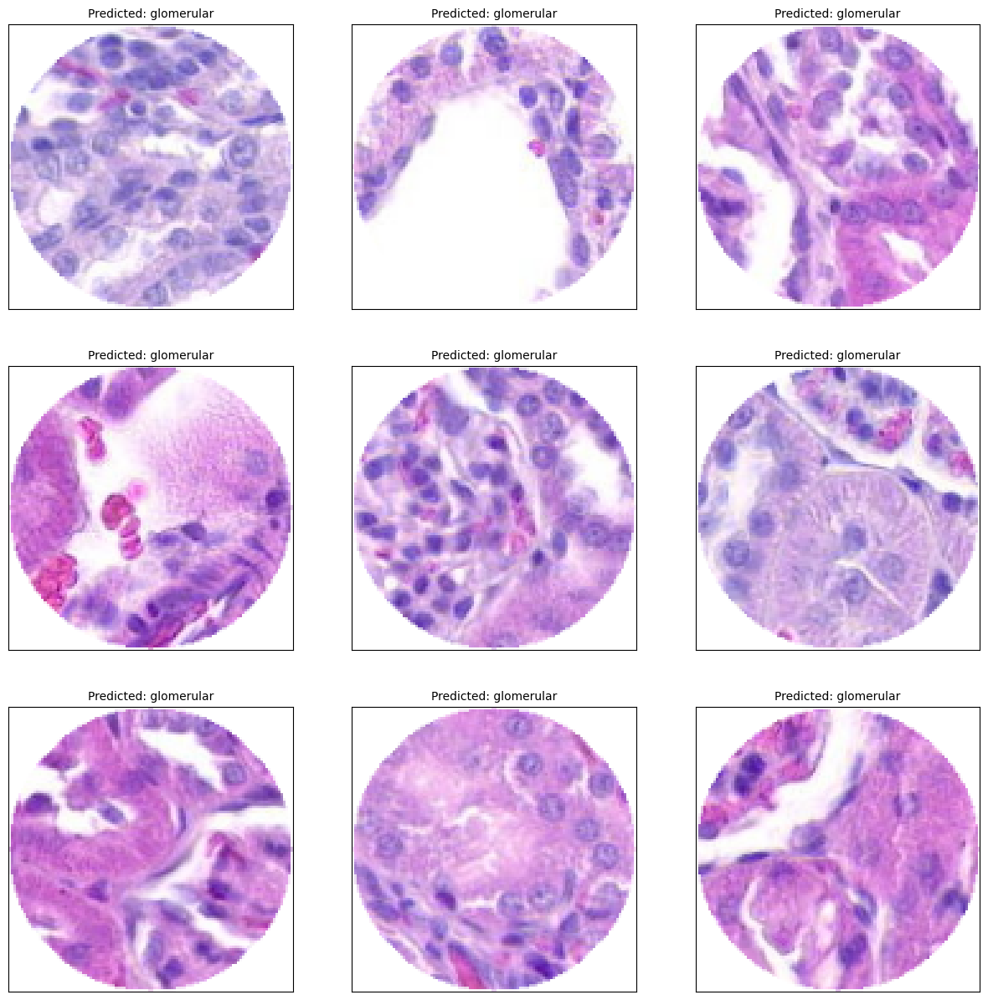

In [97]:
visualize_stx_prediction(Stx_result[0], Stx_result[1], preference= 'glomerular')